In [1]:
import os

# 현재 스크립트(노트북)가 실행되는 위치를 기준으로 상위 폴더로 이동합니다.
# 만약 노트북이 'strawberry detection/notebooks/' 안에 있다면,
# 'strawberry detection/' 폴더로 이동합니다.
current_path = os.getcwd()
print(f"Initial CWD: {current_path}")

# 'notebooks' 폴더에서 상위 폴더인 'strawberry detection'으로 이동
# 현재 CWD가 '.../strawberry detection/notebooks' 라고 가정합니다.
# os.path.dirname()을 두 번 사용하면 두 단계 위로 올라갑니다.
project_root = os.path.dirname(os.path.dirname(os.path.abspath(__file__ if '__file__' in locals() else '')))
# 또는 명시적으로 절대 경로를 설정합니다 (더 안전함)
project_root = r'C:\Users\User\Documents\백민우\Capstone\strawberry detection'


os.chdir(project_root)
print(f"Changed CWD to: {os.getcwd()}")
DATA_CFG = 'configs/data.yaml'

Initial CWD: C:\Users\User\Documents\백민우\Capstone\strawberry detection\notebooks
Changed CWD to: C:\Users\User\Documents\백민우\Capstone\strawberry detection


In [2]:
from ultralytics import YOLO
import os, cv2
import matplotlib.pyplot as plt
import yaml

DATA_CFG    = './configs/data.yaml'
DETECT_PT   = './models/weights/yolov8n.pt'
SEG_PT      = './models/weights/yolov8n-seg.pt'

In [3]:
import os

print("train 폴더 파일 수:", len(os.listdir('./data/labels/train')))
print("val   폴더 파일 수:", len(os.listdir('./data/labels/val')))

train 폴더 파일 수: 312
val   폴더 파일 수: 39


In [4]:
seg_model = YOLO('yolov8n-seg.pt')

seg_model.train(
    data    = DATA_CFG,   
    task    = 'segment',  
    epochs  = 30,
    imgsz   = 640,
    batch   = 16,
    augment=True,
    project = './runs',
    name    = 'segment_exp'
)

Ultralytics 8.3.156  Python-3.12.7 torch-2.7.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3090, 24576MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=./configs/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=segment_exp, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.

train: Scanning C:\Users\User\Documents\백민우\Capstone\strawberry detection\data\labels\train.cache... 312 images, 0 b


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access  (ping: 0.00.0 ms, read: 342.4100.9 MB/s, size: 34.6 KB)


val: Scanning C:\Users\User\Documents\백민우\Capstone\strawberry detection\data\labels\val.cache... 39 images, 0 backgr


Plotting labels to runs\segment_exp\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\segment_exp
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30      4.51G      1.469       2.53      2.482      1.469        353        640: 100%|██████████| 20/20 [00:05
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141     0.0821      0.842      0.436      0.246     0.0484      0.496      0.154      0.109



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30      4.81G      1.166      1.519      1.104      1.265        419        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.544       0.32      0.444      0.233      0.171      0.422      0.114     0.0823



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.83G      1.138      1.396     0.9663      1.261        448        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.419      0.645      0.401      0.187      0.246      0.393       0.13      0.094



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30      4.83G      1.101      1.372       0.92      1.233        378        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.402      0.596      0.387      0.181      0.226      0.356      0.113     0.0826



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      4.84G      1.093      1.358      0.891      1.229        440        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.686      0.583      0.648      0.421      0.356      0.362      0.191      0.145



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30      4.85G      1.045      1.335     0.8478      1.202        565        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.815      0.729      0.814      0.598      0.672      0.431      0.437      0.329



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      4.86G      1.021      1.318     0.8146      1.197        500        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.871      0.685      0.809      0.612      0.928      0.484      0.508       0.38



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.86G     0.9875       1.32     0.7633      1.155        535        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.893      0.703      0.839      0.641      0.861      0.463      0.501      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      4.86G     0.9648      1.281     0.7541      1.154        447        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.898      0.698       0.84      0.639      0.822      0.481       0.49      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      4.87G     0.9607      1.271     0.7495      1.149        471        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141       0.91      0.762      0.863      0.664      0.942       0.47      0.506      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30      4.88G     0.9422       1.25     0.7307      1.149        366        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.924      0.767      0.867      0.662      0.903      0.479      0.507      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30      4.88G     0.9159      1.235     0.7013      1.117        494        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.913      0.766      0.862      0.668      0.812      0.472      0.484      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      4.88G     0.8909      1.226     0.6858      1.109        335        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.922      0.769      0.862      0.662      0.782      0.477      0.486      0.372



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      4.88G     0.8951      1.225     0.6811      1.095        403        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141       0.91      0.775      0.866      0.687      0.829       0.49      0.496      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30      4.88G     0.8733      1.225     0.6537      1.084        599        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.906      0.814      0.884      0.707      0.839      0.489      0.488      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      4.88G     0.8447      1.193     0.6399      1.065        403        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.957        0.8      0.881      0.723      0.859      0.479      0.501      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      4.88G     0.8548        1.2     0.6508      1.083        451        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.946      0.803       0.89       0.73      0.913      0.479      0.509      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      4.88G     0.8237      1.159     0.6263      1.064        423        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.928       0.82      0.891      0.724      0.812      0.476      0.492      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      4.88G     0.8389      1.225     0.6336       1.06        480        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.927      0.828      0.895      0.725      0.808      0.477      0.462      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      4.88G     0.8149      1.164     0.6156      1.057        291        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141       0.93      0.805       0.88      0.732      0.839      0.479      0.496      0.383


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      4.88G     0.7488      1.056     0.5906      1.054        214        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.934      0.819      0.906       0.73       0.83      0.464      0.475      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30       4.9G     0.7229      1.056     0.5481      1.034        222        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.955      0.823      0.903      0.736      0.712      0.472      0.427      0.322



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30       4.9G       0.69      1.043     0.5149      1.007        235        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.945      0.841      0.908      0.735      0.735      0.452      0.436      0.332



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30      4.92G     0.6849      1.035     0.5066      1.012        220        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141       0.96      0.816       0.89      0.744      0.774      0.465      0.474      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      4.92G     0.6735      1.033      0.494      1.001        214        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.969      0.826      0.904      0.754      0.681      0.472      0.405      0.308



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30      4.92G     0.6685      1.037      0.488     0.9932        237        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.963      0.835      0.908      0.767      0.762      0.459      0.474      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      4.92G     0.6474      1.018     0.4798     0.9805        228        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.979      0.827      0.906      0.769      0.749      0.465      0.478       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      4.94G     0.6316     0.9908     0.4672     0.9847        203        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.978      0.834       0.91      0.768      0.638       0.49      0.409      0.312



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      4.94G     0.6336     0.9951     0.4621     0.9741        221        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141       0.98      0.822      0.901      0.767      0.633      0.494      0.415      0.313



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30      4.94G     0.6055     0.9844     0.4522     0.9683        205        640: 100%|██████████| 20/20 [00:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         39       1141      0.978      0.819      0.905      0.777      0.699      0.466      0.433       0.33



30 epochs completed in 0.043 hours.
Optimizer stripped from runs\segment_exp\weights\last.pt, 6.8MB
Optimizer stripped from runs\segment_exp\weights\best.pt, 6.8MB

Validating runs\segment_exp\weights\best.pt...
Ultralytics 8.3.156  Python-3.12.7 torch-2.7.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3090, 24576MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING Model does not support 'augment=True', reverting to single-scale prediction.
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limitin

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING Model does not support 'augment=True', reverting to single-scale prediction.
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all         39       1141      0.979      0.829      0.906       0.77      0.749      0.465      0.478       0.36
Speed: 0.2ms preprocess, 0.8ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs\segment_exp


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000202BECF6000>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.0410

In [5]:
best_ckpt = './runs/segment_exp/weights/best.pt'

test_model = YOLO(best_ckpt)

metrics = test_model.val(data=DATA_CFG, split='test', project='./runs')

Ultralytics 8.3.156  Python-3.12.7 torch-2.7.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3090, 24576MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 381.649.6 MB/s, size: 33.9 KB)


val: Scanning C:\Users\User\Documents\백민우\Capstone\strawberry detection\data\labels\test.cache... 39 images, 0 backg
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validati

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validati

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all         39       1182      0.971      0.827      0.906      0.767      0.758      0.469      0.481      0.359
Speed: 1.8ms preprocess, 15.3ms inference, 0.0ms loss, 5.0ms postprocess per image
Results saved to runs\val


In [6]:
import os
import cv2
import numpy as np

# 1) predict() 호출 (이미 reds에 결과가 있으면 생략해도 됩니다)
reds = test_model.predict(
    source='./data/images/test',
    save=True,
    project='./runs',
    name='segment_exp_test',
    batch=16,
    imgsz=640,
    conf=0.1,
    show_boxes=False,
    show_labels=False,
    show_conf=False,
    retina_masks=True,    # 이진 마스크 데이터 포함
    overlap_mask=False
)

# 2) 결과 저장용 폴더 정의
base_folder     = './runs/segment_exp_test'
inst_folder     = os.path.join(base_folder, 'instance_masks')
combined_folder = os.path.join(base_folder, 'combined_masks')

os.makedirs(inst_folder,    exist_ok=True)
os.makedirs(combined_folder, exist_ok=True)

# 3) 순회하면서 저장
for res in reds:
    # (a) 마스크 텐서를 NumPy 배열로 변환: shape = (N_instances, H, W)
    masks = res.masks.data.cpu().numpy()

    # (b) 베이스 이미지 이름 추출 (확장자 제외)
    img_path = res.path
    base     = os.path.splitext(os.path.basename(img_path))[0]

    # --- 인스턴스별 마스크 저장 ---
    for idx, m in enumerate(masks):
        mask_png = (m * 255).astype('uint8')
        out_inst = os.path.join(inst_folder, f"{base}_{idx:02d}.png")
        cv2.imwrite(out_inst, mask_png)

    # --- 통합 마스크 저장 (OR 연산) ---
    combined = np.any(masks, axis=0).astype('uint8') * 255
    out_comb = os.path.join(combined_folder, f"{base}_combined.png")
    cv2.imwrite(out_comb, combined)

# print("Instance masks saved to:", inst_folder)
# print("Combined masks saved to:", combined_folder)


image 1/39 C:\Users\User\Documents\\Capstone\strawberry detection\data\images\test\RGB_image_101.jpg: 480x640 17 strawberrys, 4.5ms
image 2/39 C:\Users\User\Documents\\Capstone\strawberry detection\data\images\test\RGB_image_105.jpg: 480x640 18 strawberrys, 4.5ms
image 3/39 C:\Users\User\Documents\\Capstone\strawberry detection\data\images\test\RGB_image_106.jpg: 480x640 15 strawberrys, 4.5ms
image 4/39 C:\Users\User\Documents\\Capstone\strawberry detection\data\images\test\RGB_image_112.jpg: 480x640 17 strawberrys, 4.5ms
image 5/39 C:\Users\User\Documents\\Capstone\strawberry detection\data\images\test\RGB_image_114.jpg: 480x640 17 strawberrys, 4.5ms
image 6/39 C:\Users\User\Documents\\Capstone\strawberry detection\data\images\test\RGB_image_129.jpg: 480x640 20 strawberrys, 4.5ms
image 7/39 C:\Users\User\Documents\\Capstone\strawberry detection\data\images\test\RGB_image_130.jpg: 480x640 21 strawberrys, 4.5ms
image 8/39 C:\Users\User\Documents\\Capstone\strawberry detection\data\imag

In [7]:
import glob

%matplotlib inline
import matplotlib.pyplot as plt

res_folder = r'C:\Users\User\Documents\백민우\Capstone\strawberry detection yolo v8\runs\segment_exp_test'
images = []
for ext in ['jpg', 'JPG', 'png', 'PNG']:
    images.extend(glob.glob(f'{res_folder}/*.{ext}'))

print('Found images:', images[:4])

plt.figure(figsize=(12,12))
for i, img_path in enumerate(images[0:4], 1):
    img = cv2.imread(img_path)
    if img is None:
        print('Cannot read:', img_path)
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2,2,i)
    plt.imshow(img)
    plt.title(img_path.split('\\')[-1]) 
    plt.axis('off')
plt.tight_layout()
plt.show() 

Found images: []


<Figure size 1200x1200 with 0 Axes>

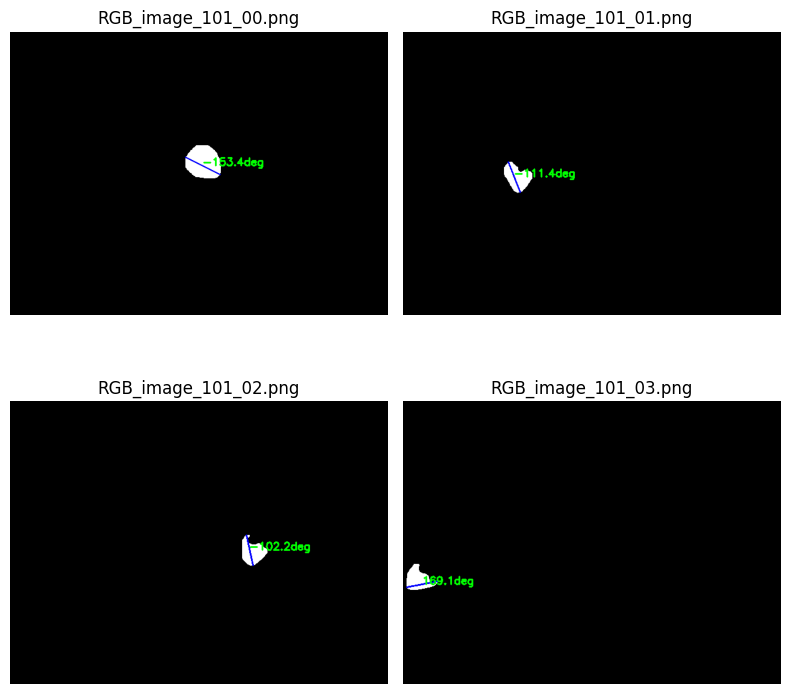

In [8]:
import os, glob, cv2
import numpy as np
import matplotlib.pyplot as plt

inst_folder = './runs/segment_exp_test/instance_masks'
viz_folder  = './runs/segment_exp_test/farthest_axis'
os.makedirs(viz_folder, exist_ok=True)

sample = glob.glob(os.path.join(inst_folder, '*.png'))[:4]
plt.figure(figsize=(8,8))

for i, mask_path in enumerate(sample, 1):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    cnt = max(cnts, key=cv2.contourArea)
    hull = cv2.convexHull(cnt).reshape(-1, 2)  # (N,2)

    max_d = 0
    p1 = p2 = None
    for j in range(len(hull)):
        for k in range(j+1, len(hull)):
            d = np.linalg.norm(hull[j] - hull[k])
            if d > max_d:
                max_d = d
                p1, p2 = tuple(hull[j]), tuple(hull[k])

    vis = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
    cv2.line(vis, p1, p2, (255, 0, 0), 2)

    angle = np.degrees(np.arctan2(p2[1]-p1[1], p2[0]-p1[0]))
    mid = (int((p1[0]+p2[0])/2), int((p1[1]+p2[1])/2))
    cv2.putText(vis, f"{angle:.1f}deg", mid,
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    ax = plt.subplot(2,2,i)
    ax.imshow(vis[...,::-1])
    ax.set_title(os.path.basename(mask_path))
    ax.axis('off')

    cv2.imwrite(os.path.join(viz_folder, os.path.basename(mask_path)), vis)

plt.tight_layout()
plt.show()

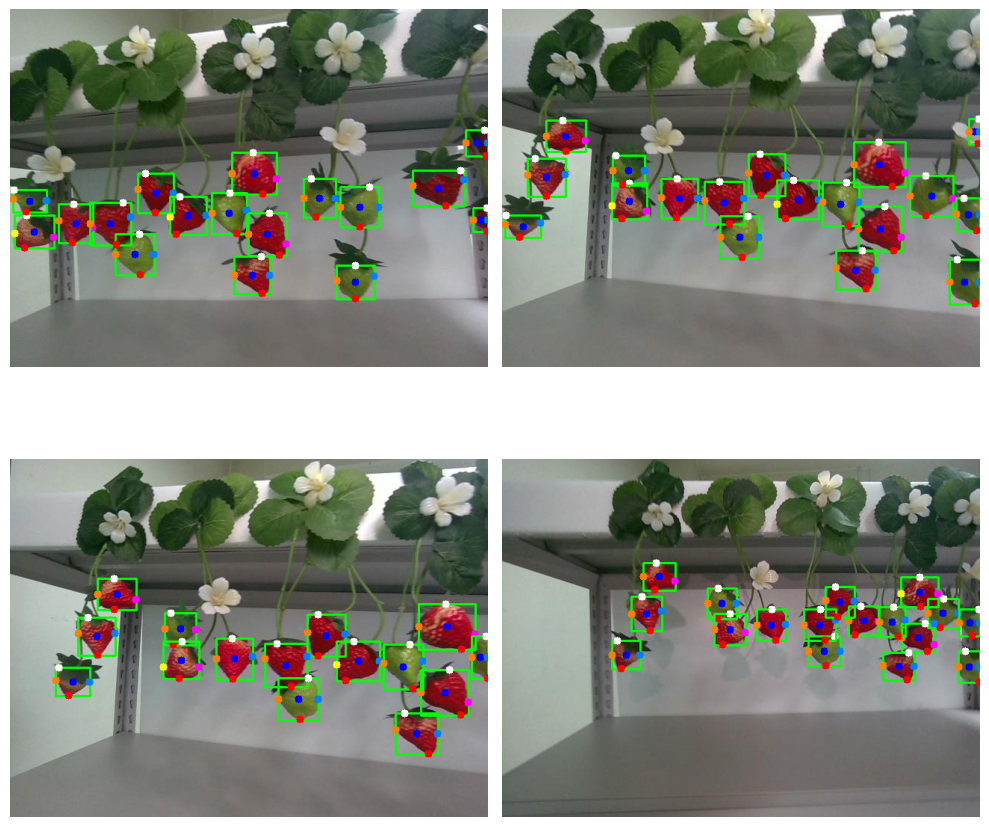

In [9]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 경로 설정
inst_folder = './runs/segment_exp_test/instance_masks'
orig_folder = './data/images/test'
out_folder  = './runs/segment_exp_test/bbox_intersections_with_top'
os.makedirs(out_folder, exist_ok=True)

for img_path in glob.glob(os.path.join(orig_folder, '*.*')):
    base       = os.path.splitext(os.path.basename(img_path))[0]
    img        = cv2.imread(img_path)
    mask_paths = sorted(glob.glob(os.path.join(inst_folder, f'{base}_*.png')))
    if not mask_paths:
        continue

    for mp in mask_paths:
        # 1) 이진 마스크 & 컨투어
        raw = cv2.imread(mp, cv2.IMREAD_UNCHANGED)
        if raw is None: 
            continue
        mask_bool = raw if raw.ndim == 2 else raw[:, :, 0]
        mask_bool = mask_bool > 0
        cnts, _   = cv2.findContours(
            mask_bool.astype(np.uint8),
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )
        if not cnts:
            continue
        cnt = max(cnts, key=cv2.contourArea)

        # 2) BBox 및 중심 좌표
        x, y, w, h = cv2.boundingRect(cnt)
        cx, cy     = x + w//2, y + h//2
        y_top      = y
        y_bottom   = y + h - 1
        x_left     = x
        x_right    = x + w - 1

        # 2.1) Bounding box 그리기 (초록)
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # 3) 하단 가로 교차점 (빨강)
        xs_bot = np.where(mask_bool[y_bottom, x:x+w])[0] + x
        xi_bot = int(np.sort(xs_bot)[len(xs_bot)//2]) if xs_bot.size else None

        # 4) 상단 가로 교차점 (파랑-흰색)
        xs_top = np.where(mask_bool[y_top, x:x+w])[0] + x
        xi_top = int(np.sort(xs_top)[len(xs_top)//2]) if xs_top.size else None

        # 5) 측면 교차점: 아래 방향
        yi_left_down = yi_right_down = None
        for yy in range(cy, y_bottom+1):
            if yi_left_down is None and mask_bool[yy, x_left]:
                yi_left_down = yy
            if yi_right_down is None and mask_bool[yy, x_right]:
                yi_right_down = yy
            if yi_left_down is not None and yi_right_down is not None:
                break

        # 6) 측면 교차점: 위 방향
        yi_left_up = yi_right_up = None
        for yy in range(cy, y_top-1, -1):
            if yi_left_up is None and mask_bool[yy, x_left]:
                yi_left_up = yy
            if yi_right_up is None and mask_bool[yy, x_right]:
                yi_right_up = yy
            if yi_left_up is not None and yi_right_up is not None:
                break

        # 7) 점 그리기
        # (a) BBox 중심 (파랑)
        cv2.circle(img, (cx, cy), 5, (255, 0, 0), -1)
        # (b) 하단 교차점 (빨강)
        if xi_bot is not None:
            cv2.circle(img, (xi_bot, y_bottom), 5, (0, 0, 255), -1)
        # (c) 상단 교차점 (흰색)
        if xi_top is not None:
            cv2.circle(img, (xi_top, y_top), 5, (255, 255, 255), -1)
        # (d) 아래쪽 측면 교차점 (노랑/핑크)
        if yi_left_down is not None:
            cv2.circle(img, (x_left, yi_left_down), 5, (0, 255, 255), -1)
        if yi_right_down is not None:
            cv2.circle(img, (x_right, yi_right_down), 5, (255, 0, 255), -1)
        # (e) 위쪽 측면 교차점 (주황/금색)
        if yi_left_up is not None:
            cv2.circle(img, (x_left, yi_left_up), 5, (0, 128, 255), -1)
        if yi_right_up is not None:
            cv2.circle(img, (x_right, yi_right_up), 5, (255, 128, 0), -1)

    # 결과 저장
    out_path = os.path.join(out_folder, f'{base}_bbox_pts_with_top.png')
    cv2.imwrite(out_path, img)

# 샘플 시각화
sample = glob.glob(os.path.join(out_folder, '*_bbox_pts_with_top.png'))[:4]
plt.figure(figsize=(10,10))
for i, sp in enumerate(sample,1):
    vis = cv2.imread(sp)
    ax = plt.subplot(2,2,i)
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.axis('off')
plt.tight_layout()
plt.show()


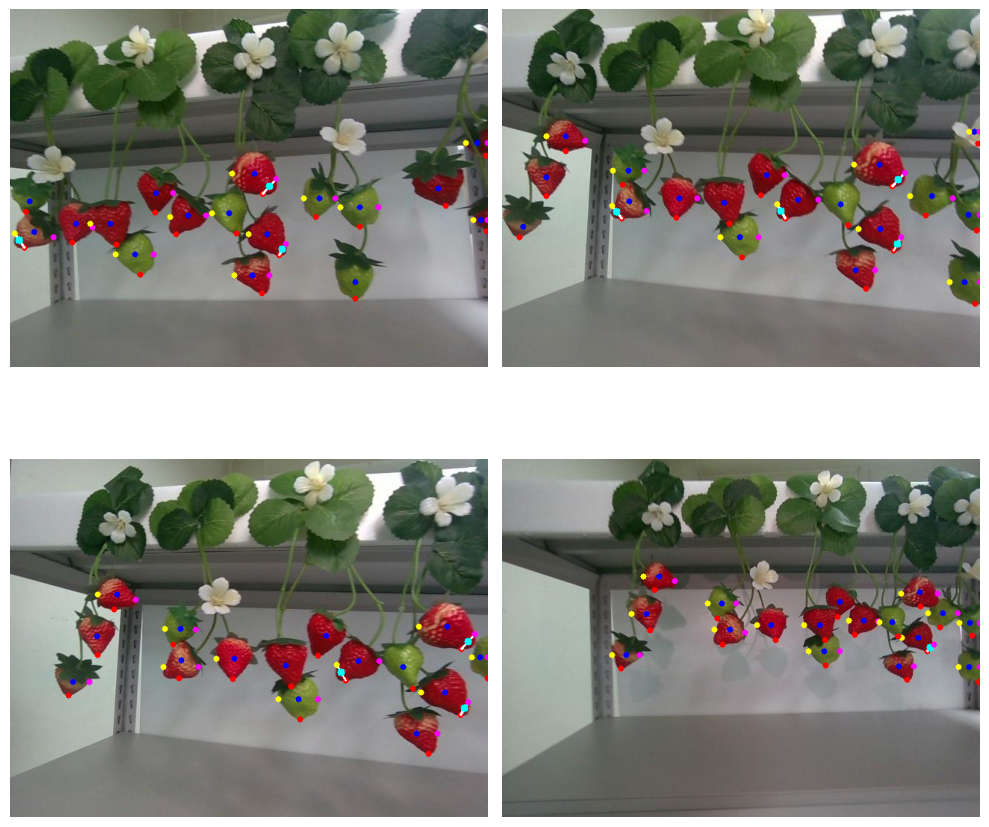

In [10]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 경로 설정
inst_folder = './runs/segment_exp_test/instance_masks'
orig_folder = './data/images/test'
out_folder  = './runs/segment_exp_test/bbox_pts_with_mid'
os.makedirs(out_folder, exist_ok=True)

for img_path in glob.glob(os.path.join(orig_folder, '*.*')):
    base       = os.path.splitext(os.path.basename(img_path))[0]
    img        = cv2.imread(img_path)
    mask_paths = sorted(glob.glob(os.path.join(inst_folder, f'{base}_*.png')))
    if not mask_paths:
        continue

    for mp in mask_paths:
        # 1) 이진 마스크 & 컨투어
        raw       = cv2.imread(mp, cv2.IMREAD_UNCHANGED)
        mask_bool = raw if raw.ndim == 2 else raw[:, :, 0]
        mask_bool = mask_bool > 0
        cnts, _   = cv2.findContours(
            mask_bool.astype(np.uint8),
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )
        if not cnts:
            continue
        cnt = max(cnts, key=cv2.contourArea)

        # 2) BBox 및 중심 좌표
        x, y, w, h = cv2.boundingRect(cnt)
        cx, cy     = x + w//2, y + h//2
        y_bottom   = y + h - 1
        x_left     = x
        x_right    = x + w - 1

        # 3) 하단 교차점 (빨강)
        xs_bot = np.where(mask_bool[y_bottom, x:x+w])[0] + x
        if xs_bot.size:
            xs_sorted = np.sort(xs_bot)
            xi_bot = int(xs_sorted[len(xs_sorted)//2])
            red_pt = np.array([xi_bot, y_bottom])
            cv2.circle(img, tuple(red_pt), 4, (0, 0, 255), -1)
        else:
            red_pt = None

        # 4) 측면 교차점 아래쪽 (노랑/핑크)
        yi_left = yi_right = None
        for yy in range(cy, y_bottom+1):
            if yi_left is None and mask_bool[yy, x_left]:
                yi_left = yy
            if yi_right is None and mask_bool[yy, x_right]:
                yi_right = yy
            if yi_left is not None and yi_right is not None:
                break

        # 5) BBox 중심 (파랑)
        cv2.circle(img, (cx, cy), 4, (255, 0, 0), -1)

        # 6) 거리 비교 후 선분 그리기 & 중간 지점 표시
        if red_pt is not None:
            center_pt = np.array([cx, cy])
            for side_x, side_y, color in [
                (x_left, yi_left, (0,255,255)),   # 왼쪽 노랑
                (x_right, yi_right, (255,0,255))  # 오른쪽 핑크
            ]:
                if side_y is None:
                    continue
                side_pt = np.array([side_x, side_y])
                # 중심점 vs 빨간점 거리 비교
                d_center = np.linalg.norm(side_pt - center_pt)
                d_red    = np.linalg.norm(side_pt - red_pt)
                if d_red < d_center:
                    # 흰색 선분
                    cv2.line(img,
                             tuple(side_pt.tolist()),
                             tuple(red_pt.tolist()),
                             (255,255,255), 2)
                    # 선분 중간점
                    mid_pt = ((side_pt + red_pt) / 2).astype(int)
                    cv2.circle(img, tuple(mid_pt.tolist()), 5, (255,255,0), -1)
                # 원래 노랑/핑크 점
                cv2.circle(img, (side_x, side_y), 4, color, -1)

    # 결과 저장
    out_path = os.path.join(out_folder, f'{base}_mid.png')
    cv2.imwrite(out_path, img)

# 샘플 시각화
sample = glob.glob(os.path.join(out_folder, '*_mid.png'))[:4]
plt.figure(figsize=(10,10))
for i, sp in enumerate(sample,1):
    vis = cv2.imread(sp)
    ax = plt.subplot(2,2,i)
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.axis('off')
plt.tight_layout()
plt.show()


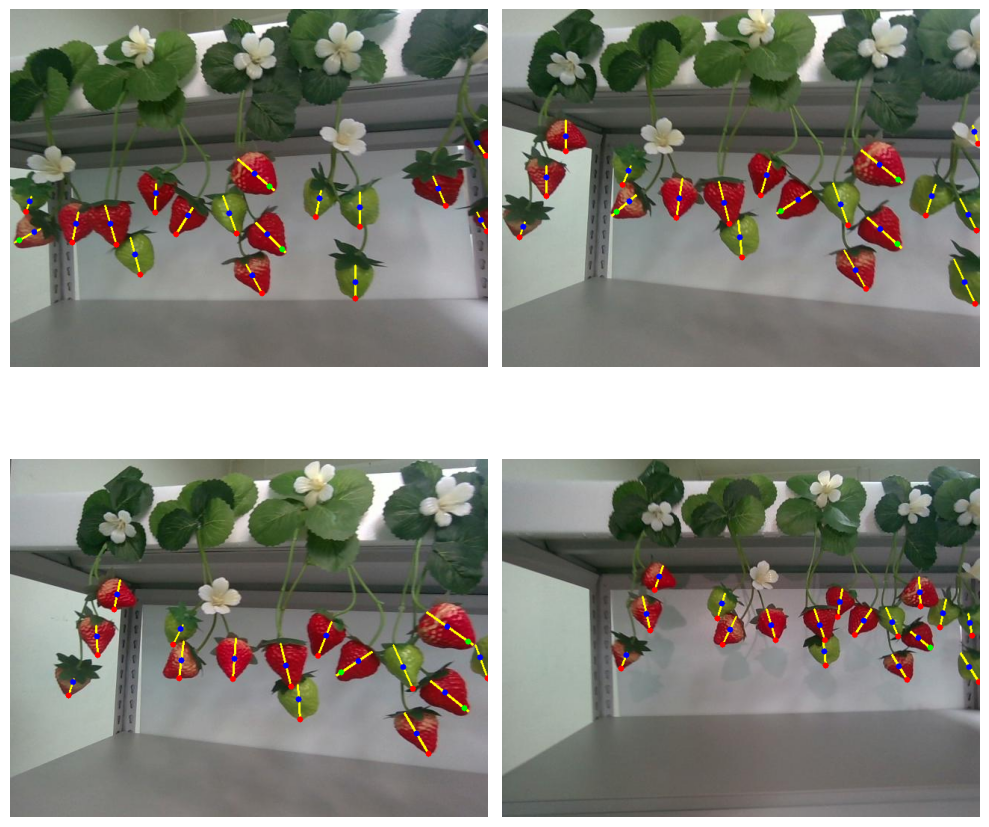

In [11]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 경로 설정 (작업 디렉터리 내)es'

inst_folder = './runs/segment_exp_test/instance_masks'
orig_folder = './data/images/test'
out_folder  = './runs/segment_exp_test/bbox_extended_lines'

os.makedirs(out_folder, exist_ok=True)

for img_path in glob.glob(os.path.join(orig_folder, '*.*')):
    base       = os.path.splitext(os.path.basename(img_path))[0]
    img        = cv2.imread(img_path)
    mask_paths = sorted(glob.glob(os.path.join(inst_folder, f'{base}_*.png')))
    if not mask_paths:
        continue

    h, w = img.shape[:2]
    for mp in mask_paths:
        # 1) 마스크 로드 & 바이너리화
        raw       = cv2.imread(mp, cv2.IMREAD_UNCHANGED)
        mask_bool = raw if raw.ndim==2 else raw[:,:,0]
        mask_bool = mask_bool>0

        # 2) 가장 큰 컨투어
        cnts, _ = cv2.findContours(mask_bool.astype(np.uint8),
                                   cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not cnts:
            continue
        cnt = max(cnts, key=cv2.contourArea)

        # 3) BBox 및 중심 좌표
        x,y,wb,hb = cv2.boundingRect(cnt)
        cx,cy     = x+wb//2, y+hb//2

        # 4) end_pt 결정 (mid_pt or red_pt)
        # 4-1) 하단 중앙 빨간점
        y_bot = y+hb-1
        xs = np.where(mask_bool[y_bot, x:x+wb])[0] + x
        red_pt = None
        if xs.size>0:
            xs_sorted = np.sort(xs)
            red_pt = np.array([int(xs_sorted[len(xs_sorted)//2]), y_bot])

        # 4-2) mid_pt 계산
        mid_pt = None
        if red_pt is not None:
            for sx in (x, x+wb-1):
                sy = None
                for yy in range(cy, y_bot+1):
                    if mask_bool[yy, sx]:
                        sy = yy
                        break
                if sy is None:
                    continue
                side_pt = np.array([sx, sy])
                if np.linalg.norm(side_pt-red_pt) < np.linalg.norm(side_pt-[cx,cy]):
                    mid_pt = ((side_pt + red_pt)//2).astype(int)
                    break

        # 5) 선분 시작/끝점 설정
        if mid_pt is not None:
            p0 = np.array([cx, cy])
            p1 = mid_pt
        elif red_pt is not None:
            p0 = np.array([cx, cy])
            p1 = red_pt
        else:
            continue

        # 6) 방향 벡터 정규화
        v = p1 - p0
        norm = np.linalg.norm(v)
        if norm == 0:
            continue
        dv = v / norm

        # 7) forward 확장
        pt = p1.astype(float)
        while True:
            nxt = pt + dv
            xi, yi = int(round(nxt[0])), int(round(nxt[1]))
            if xi < 0 or xi >= w or yi < 0 or yi >= h or not mask_bool[yi, xi]:
                break
            pt = nxt
        far_end = tuple(np.round(pt).astype(int))

        # 8) backward 확장
        pt = p0.astype(float)
        while True:
            prev = pt - dv
            xi, yi = int(round(prev[0])), int(round(prev[1]))
            if xi < 0 or xi >= w or yi < 0 or yi >= h or not mask_bool[yi, xi]:
                break
            pt = prev
        near_end = tuple(np.round(pt).astype(int))

        # 9) 그리기
        cv2.line(img, near_end, far_end, (0,255,255), 2)
        cv2.circle(img, (cx, cy), 4, (255,0,0), -1)  # center
        if mid_pt is not None:
            cv2.circle(img, tuple(mid_pt.tolist()), 4, (0,255,0), -1)
        else:
            cv2.circle(img, tuple(red_pt.tolist()), 4, (0,0,255), -1)

    # 10) 저장 및 샘플 시각화
    out_path = os.path.join(out_folder, f'{base}_extended.png')
    cv2.imwrite(out_path, img)

# 샘플 출력
sample = glob.glob(os.path.join(out_folder, '*_extended.png'))[:4]
plt.figure(figsize=(10,10))
for i, sp in enumerate(sample,1):
    vis = cv2.imread(sp)
    ax = plt.subplot(2,2,i)
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.axis('off')
plt.tight_layout()
plt.show()


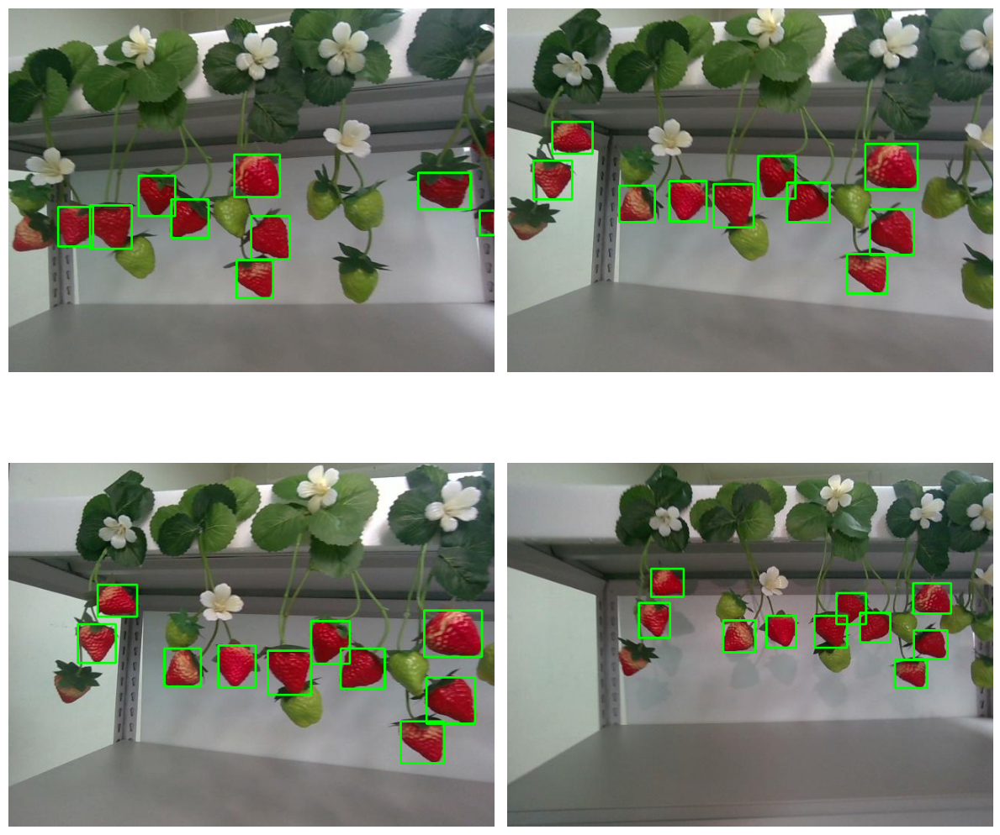

In [45]:
import os
import glob
import cv2
import numpy as np
from collections import defaultdict
import matplotlib.pyplot as plt

# ── 설정 ─────────────────────────────────────────────────
inst_folder = './runs/segment_exp_test/instance_masks'
rgb_folder  = './data/images/test'
out_folder  = './runs/segment_exp_test/ripe_viz'
os.makedirs(out_folder, exist_ok=True)

RIPE_RATIO_THRESH = 0.70

def is_ripe_mask(hsv, mask):
    h, s = hsv[:, :, 0], hsv[:, :, 1]
    m = mask.astype(bool)
    red_px = ((h < 10) | (h > 160)) & (s > 50) & m
    return m.sum() > 0 and (red_px.sum() / m.sum()) >= RIPE_RATIO_THRESH

mask_paths = sorted(glob.glob(os.path.join(inst_folder, '*.png')))
groups = defaultdict(list)
for p in mask_paths:
    key = os.path.basename(p).rsplit('_', 1)[0]
    groups[key].append(p)

for key, paths in groups.items():
    img = None
    for ext in ('.png', '.jpg'):
        fp = os.path.join(rgb_folder, key + ext)
        if os.path.exists(fp):
            img = cv2.imread(fp)
            break
    if img is None:
        continue

    h, w = img.shape[:2]
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    vis = img.copy()

    # 마스크 로드 & HSV 숙성 필터만 적용
    ripe_masks = []
    for p in paths:
        m = cv2.imread(p, cv2.IMREAD_UNCHANGED)
        if m is None:
            continue
        if m.ndim > 2:
            m = (np.any(m > 0, axis=2) * 255).astype(np.uint8)
        mask2d = (m > 0).astype(np.uint8)
        if is_ripe_mask(hsv, mask2d):
            ripe_masks.append(mask2d)
    n = len(ripe_masks)
    if n == 0:
        continue

    # 초록 박스만 그림 (번호 제거)
    for mask in ripe_masks:
        x, y, bw, bh = cv2.boundingRect(mask)
        cv2.rectangle(vis, (x, y), (x + bw, y + bh), (0, 255, 0), 2)

    outp = os.path.join(out_folder, f'{key}_ripe_only.png')
    cv2.imwrite(outp, vis)

# 아래는 뷰어
paths = sorted(glob.glob(os.path.join(out_folder, '*_ripe_only.png')))[:4]
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
for ax, p in zip(axes.flat, paths):
    img = cv2.imread(p)[..., ::-1]
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show()


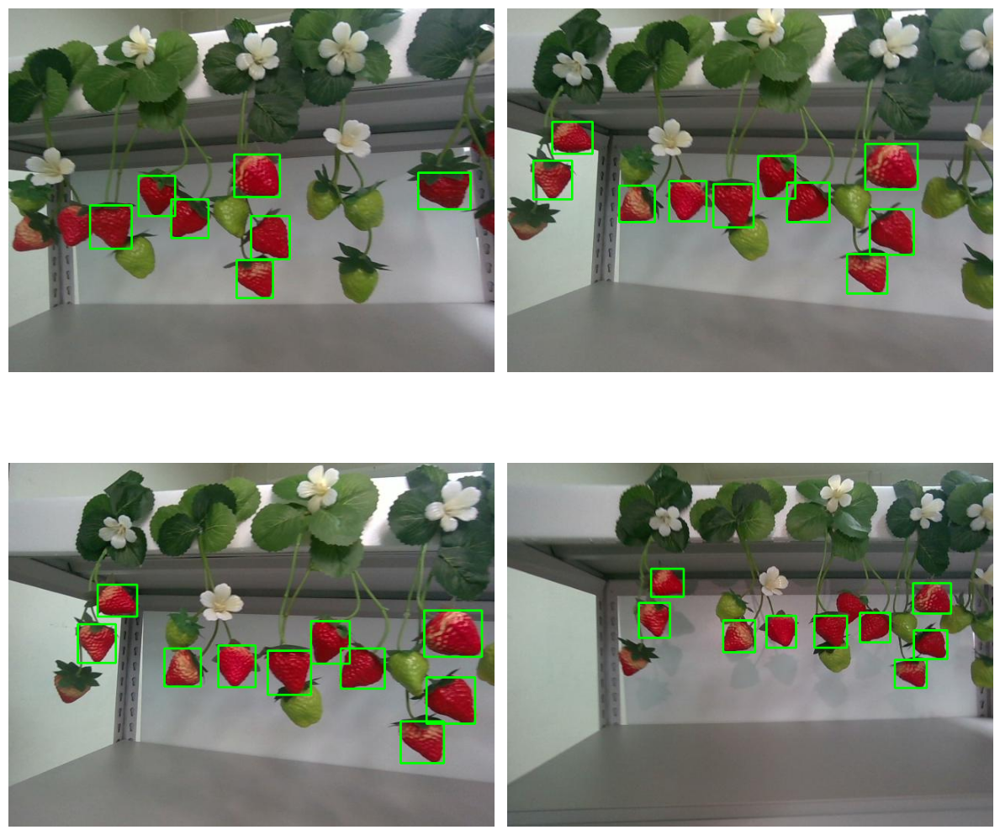

In [47]:
import os, glob, cv2, numpy as np
from collections import defaultdict
import matplotlib.pyplot as plt

# ── 경로 설정 ────────────────────────────────────────────
inst_folder = './runs/segment_exp_test/instance_masks'
rgb_folder  = './data/images/test'
out_folder  = './runs/segment_exp_test/ripe_viz'
os.makedirs(out_folder, exist_ok=True)

# ── 하이퍼파라미터 ───────────────────────────────────────
RIPE_RATIO_THRESH = 0.70        # HSV 숙성 기준
MIN_PIXELS        = 10          # 픽셀 교집합 임계값
IOU_THRESH        = 0.10        # BBox IoU 백업 기준
KERNEL            = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
RADIUS            = 2           # dilate 시 BBox 확장 여유(pixels)

# ── 함수: HSV 기반 숙성 판정 ─────────────────────────────
def is_ripe_mask(hsv, mask):
    h, s = hsv[:,:,0], hsv[:,:,1]
    m = mask.astype(bool)
    red = ((h < 10) | (h > 160)) & (s > 50) & m
    return m.sum() > 0 and (red.sum() / m.sum()) >= RIPE_RATIO_THRESH

# ── 1) 파일 그룹화 ──────────────────────────────────────
mask_paths = sorted(glob.glob(os.path.join(inst_folder, '*.png')))
groups = defaultdict(list)
for p in mask_paths:
    key = os.path.basename(p).rsplit('_', 1)[0]   # 예: 000123_0.png → 000123
    groups[key].append(p)

# ── 2) 프레임별 처리 ─────────────────────────────────────
for key, paths in groups.items():
    # (a) RGB 로드
    img = None
    for ext in ('.png', '.jpg'):
        fp = os.path.join(rgb_folder, key + ext)
        if os.path.exists(fp):
            img = cv2.imread(fp); break
    if img is None: continue

    h, w = img.shape[:2]
    hsv  = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    vis  = img.copy()

    # (b) 마스크 읽기 + BBox 선계산
    masks, boxes, ripe_idx = [], [], []
    for p in paths:
        m = cv2.imread(p, cv2.IMREAD_UNCHANGED)
        if m is None: continue
        if m.ndim > 2:
            m = (np.any(m > 0, axis=2) * 255).astype(np.uint8)
        mask2d = (m > 0).astype(np.uint8)
        x, y, bw, bh = cv2.boundingRect(mask2d)
        masks.append(mask2d)
        boxes.append((x, y, bw, bh))
        if is_ripe_mask(hsv, mask2d):
            ripe_idx.append(len(masks)-1)
    n = len(masks)
    if n == 0 or len(ripe_idx) == 0: continue

    # (c) 겹침(Occlusion)·잘림(Truncation) 판정 ----------------
    occluded, truncated = set(), set()

    #  c-1) 잘림: BBox가 프레임 경계와 맞닿으면 제외
    for k, (x, y, bw, bh) in enumerate(boxes):
        if x <= 1 or y <= 1 or x+bw >= w-1 or y+bh >= h-1:
            truncated.add(k)

    #  c-2) 겹침: BBox로 1차 필터 → 픽셀·dilate·IoU 세부 판정
    for i in ripe_idx:
        xi, yi, wi, hi = boxes[i]
        # dilate 반경만큼 확장한 i의 영역
        xi1, yi1 = xi - RADIUS, yi - RADIUS
        xi2, yi2 = xi + wi + RADIUS, yi + hi + RADIUS

        for j in range(n):
            if i == j: continue

            xj, yj, wj, hj = boxes[j]
            # ── BBox 사전 필터 ─────────────────────────────
            if (xj   > xi2  or  xj+wj < xi1 or
                yj   > yi2  or  yj+hj < yi1):
                continue  # 근접 가능성조차 없음 → skip

            mi, mj = masks[i], masks[j]

            # ── ① 픽셀 엄밀 겹침 ──────────────────────────
            inter = np.logical_and(mi, mj)
            if inter.sum() >= MIN_PIXELS:
                if mi.sum() < mj.sum(): occluded.add(i)
                continue  # 이미 결정 → 다음 j

            # ── ② dilate 근접 판정 ──────────────────────
            mi_d = cv2.dilate(mi, KERNEL, iterations=1)
            mj_d = cv2.dilate(mj, KERNEL, iterations=1)
            inter2 = np.logical_and(mi_d, mj_d)
            if inter2.sum() >= MIN_PIXELS:
                if mi.sum() < mj.sum(): occluded.add(i)
                continue

            # ── ③ BBox IoU fallback ─────────────────────
            xi1b, yi1b = max(xi, xj), max(yi, yj)
            xi2b, yi2b = min(xi+wi, xj+wj), min(yi+hi, yj+hj)
            if xi2b > xi1b and yi2b > yi1b:
                inter_a = (xi2b - xi1b) * (yi2b - yi1b)
                union_a = wi*hi + wj*hj - inter_a
                if inter_a / union_a > IOU_THRESH:
                    if mi.sum() < mj.sum(): occluded.add(i)

    # (d) 최종 visible 숙성 인덱스
    visible_ripe = [k for k in ripe_idx if k not in occluded and k not in truncated]
    if not visible_ripe: continue

    # ── 3) 시각화 ───────────────────────────────────────
    for k in visible_ripe:
        x, y, bw, bh = boxes[k]
        cv2.rectangle(vis, (x, y), (x+bw, y+bh), (0,255,0), 2)

    cv2.imwrite(os.path.join(out_folder, f'{key}_ripe_only.png'), vis)

# ── 4) 미리보기 ─────────────────────────────────────────
pre = sorted(glob.glob(os.path.join(out_folder, '*_ripe_only.png')))[:4]
if pre:
    fig, axarr = plt.subplots(2,2, figsize=(12,12))
    for ax, p in zip(axarr.flat, pre):
        ax.imshow(cv2.imread(p)[...,::-1]); ax.axis('off')
    plt.tight_layout(); plt.show()


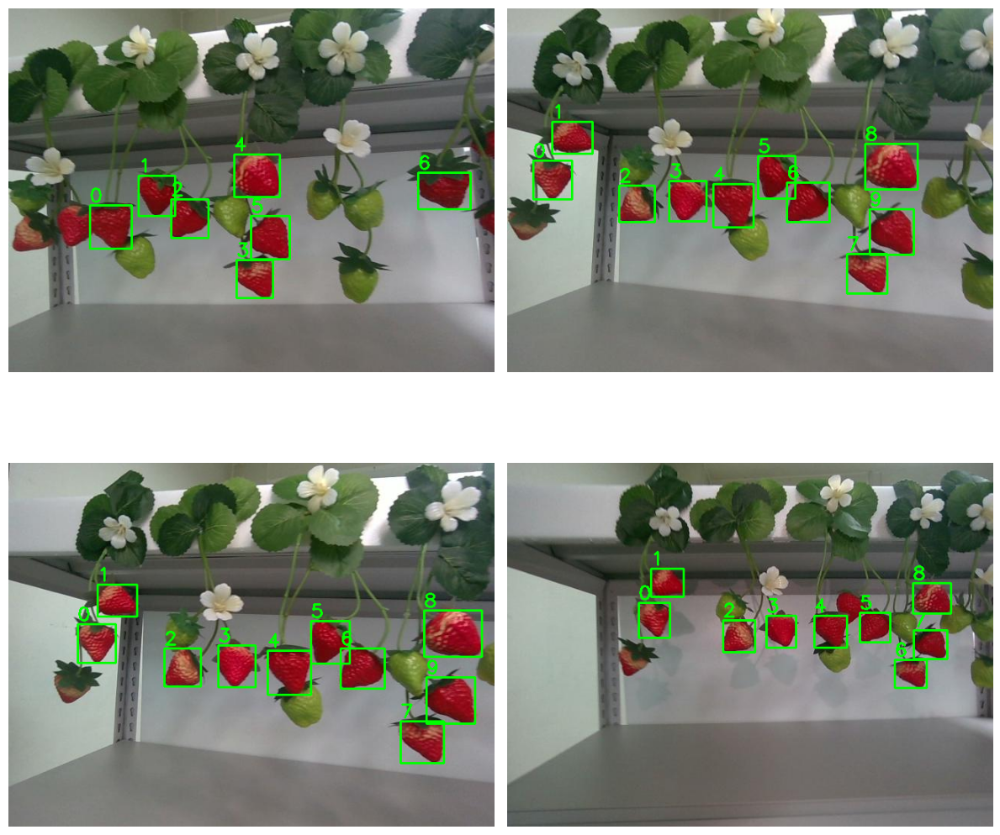

In [49]:
import os, glob, cv2, numpy as np
from collections import defaultdict
import matplotlib.pyplot as plt

# ── 경로 설정 ────────────────────────────────────────────
inst_folder = './runs/segment_exp_test/instance_masks'
rgb_folder  = './data/images/test'
out_folder  = './runs/segment_exp_test/numbering_viz'
os.makedirs(out_folder, exist_ok=True)

# ── 하이퍼파라미터 ───────────────────────────────────────
RIPE_RATIO_THRESH = 0.70   # HSV 숙성 기준
MIN_PIXELS        = 10     # 픽셀 교집합 임계값
IOU_THRESH        = 0.10   # BBox IoU Fallback
KERNEL            = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
RADIUS            = 2      # dilate 반경 → BBox 확장 여유(pixels)

# ── HSV 숙성 판정 함수 ──────────────────────────────────
def is_ripe_mask(hsv, mask):
    h, s = hsv[:,:,0], hsv[:,:,1]
    m = mask.astype(bool)
    red = ((h < 10) | (h > 160)) & (s > 50) & m
    return m.sum() > 0 and (red.sum() / m.sum()) >= RIPE_RATIO_THRESH

# ── 1) 마스크 그룹화 (파일명 기준) ───────────────────────
mask_paths = sorted(glob.glob(os.path.join(inst_folder, '*.png')))
groups = defaultdict(list)
for p in mask_paths:
    groups[os.path.basename(p).rsplit('_',1)[0]].append(p)

# ── 2) 프레임별 처리 ─────────────────────────────────────
for key, paths in groups.items():

    # (a) RGB 로드 ------------------------------------------------------
    img = None
    for ext in ('.png', '.jpg'):
        fp = os.path.join(rgb_folder, key + ext)
        if os.path.exists(fp):
            img = cv2.imread(fp); break
    if img is None: continue

    h, w = img.shape[:2]
    hsv  = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    vis  = img.copy()

    # (b) 마스크 읽기 + BBox 선계산 ------------------------------------
    masks, boxes, ripe_idx = [], [], []
    for p in paths:
        m = cv2.imread(p, cv2.IMREAD_UNCHANGED)
        if m is None: continue
        if m.ndim > 2:                      # RGBA → 2D
            m = (np.any(m > 0, axis=2)*255).astype(np.uint8)
        mask2d = (m > 0).astype(np.uint8)
        x, y, bw, bh = cv2.boundingRect(mask2d)
        masks.append(mask2d)
        boxes.append((x, y, bw, bh))
        if is_ripe_mask(hsv, mask2d):
            ripe_idx.append(len(masks)-1)

    n = len(masks)
    if n == 0 or len(ripe_idx) == 0: continue

    # (c) 잘림(truncation) 판정 ---------------------------------------
    truncated = set()
    for k, (x, y, bw, bh) in enumerate(boxes):
        if x <= 1 or y <= 1 or x+bw >= w-1 or y+bh >= h-1:
            truncated.add(k)

    # (d) 겹침(occlusion) 판정 ----------------------------------------
    occluded = set()
    for i in ripe_idx:
        xi, yi, wi, hi = boxes[i]
        # dilate 반경만큼 BBox 확장
        xi1, yi1 = xi-RADIUS, yi-RADIUS
        xi2, yi2 = xi+wi+RADIUS, yi+hi+RADIUS

        for j in range(n):
            if i == j or j in occluded:   # 이미 가려진 애는 생략
                continue

            xj, yj, wj, hj = boxes[j]

            # ── 1단계: BBox 빠른 거르기 -----------------------------
            if (xj   > xi2 or xj+wj < xi1 or
                yj   > yi2 or yj+hj < yi1):
                continue

            mi, mj = masks[i], masks[j]

            # ── 2-① 픽셀 교집합 -------------------------------
            if (np.logical_and(mi, mj)).sum() >= MIN_PIXELS:
                occluded.add(i if mi.sum() < mj.sum() else j)
                continue

            # ── 2-② dilate 후 교집합 --------------------------
            mi_d = cv2.dilate(mi, KERNEL, iterations=1)
            mj_d = cv2.dilate(mj, KERNEL, iterations=1)
            if (np.logical_and(mi_d, mj_d)).sum() >= MIN_PIXELS:
                occluded.add(i if mi.sum() < mj.sum() else j)
                continue

            # ── 2-③ BBox IoU Fallback -------------------------
            xi1b, yi1b = max(xi, xj), max(yi, yj)
            xi2b, yi2b = min(xi+wi, xj+wj), min(yi+hi, yj+hj)
            if xi2b > xi1b and yi2b > yi1b:
                inter_a = (xi2b-xi1b)*(yi2b-yi1b)
                union_a = wi*hi + wj*hj - inter_a
                if inter_a/union_a > IOU_THRESH:
                    occluded.add(i if mi.sum() < mj.sum() else j)

    # (e) 최종 visible 숙성 마스크 ------------------------------------
    visible = [k for k in ripe_idx if k not in occluded and k not in truncated]
    if not visible: continue

    # (f) 좌→우 정렬 후 번호 부여 -----------------------------------
    centers = [(k, np.where(masks[k]==1)[1].mean()) for k in visible]
    centers.sort(key=lambda x: x[1])
    new_id = {k: idx for idx,(k,_) in enumerate(centers)}

    # (g) 시각화 ------------------------------------------------------
    for k in visible:
        x,y,bw,bh = boxes[k]
        cv2.rectangle(vis, (x,y), (x+bw,y+bh), (0,255,0), 2)
        cv2.putText(vis, str(new_id[k]), (x, y-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2)

    cv2.imwrite(os.path.join(out_folder, f'{key}_ripe_num.png'), vis)

# ── 3) 미리보기 -------------------------------------------------------
preview = sorted(glob.glob(os.path.join(out_folder, '*_ripe_num.png')))[:4]
if preview:
    fig, axarr = plt.subplots(2,2, figsize=(12,12))
    for ax, p in zip(axarr.flat, preview):
        ax.imshow(cv2.imread(p)[...,::-1]); ax.axis('off')
    plt.tight_layout(); plt.show()


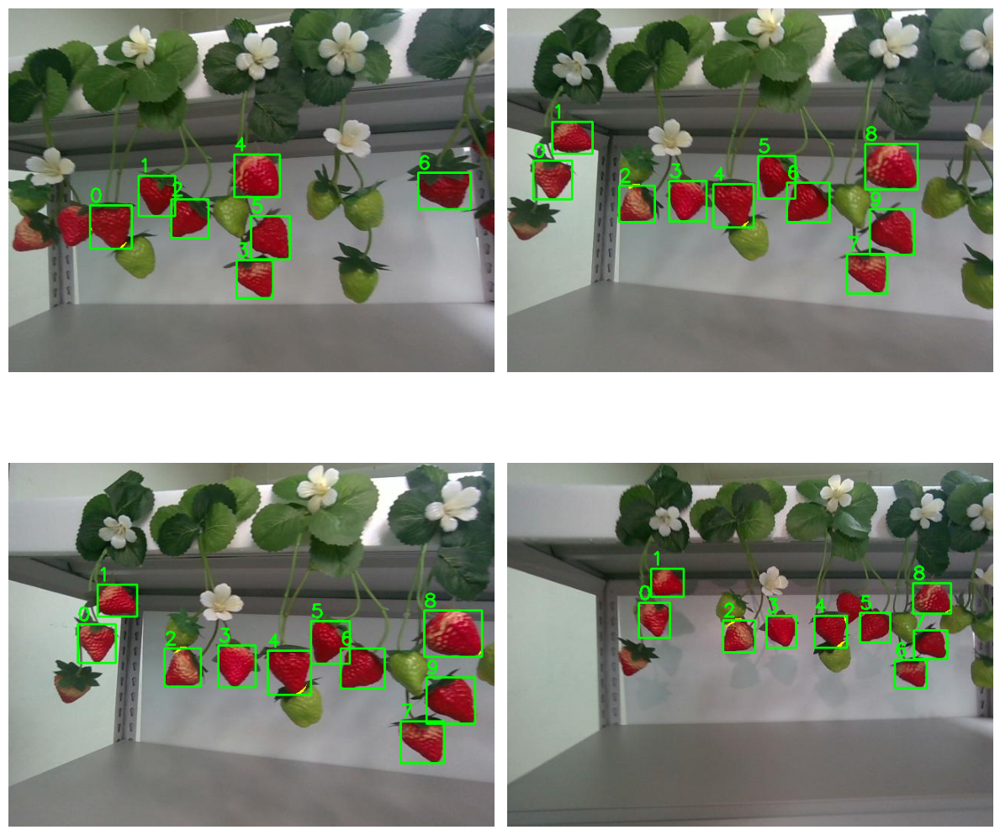

In [51]:
import os, glob, cv2, numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# ── 폴더 설정 ───────────────────────────────────────────
inst_folder = './runs/segment_exp_test/instance_masks'
rgb_folder  = './data/images/test'
out_folder  = './runs/segment_exp_test/numbering_viz_occluded_ripe_only'
os.makedirs(out_folder, exist_ok=True)

# ── 파라미터 ────────────────────────────────────────────
RIPE_RATIO_THRESH = 0.70
MIN_PIXELS        = 10
IOU_THRESH        = 0.10
KERNEL            = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
RADIUS            = 2                    # dilate 반경 → BBox 확장 여유(px)

def is_ripe_mask(hsv, mask):
    h, s = hsv[:,:,0], hsv[:,:,1]
    m    = mask.astype(bool)
    red  = ((h < 10) | (h > 160)) & (s > 50) & m
    return m.sum() > 0 and (red.sum() / m.sum()) >= RIPE_RATIO_THRESH

# ── 1) 마스크 파일 그룹화 ───────────────────────────────
mask_paths = sorted(glob.glob(os.path.join(inst_folder, '*.png')))
groups = defaultdict(list)
for p in mask_paths:
    groups[os.path.basename(p).rsplit('_',1)[0]].append(p)

# ── 2) 그룹별 처리 ─────────────────────────────────────
for key, paths in groups.items():
    # (a) RGB 로드
    img = None
    for ext in ('.png', '.jpg'):
        fp = os.path.join(rgb_folder, key+ext)
        if os.path.exists(fp):
            img = cv2.imread(fp); break
    if img is None: continue

    h, w = img.shape[:2]
    hsv  = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    vis  = img.copy()
    overlap = np.zeros((h, w), dtype=bool)

    # (b) 마스크 읽기 + BBox 선계산 + 숙성 판정
    masks, boxes, ripe_idx = [], [], []
    for p in paths:
        m = cv2.imread(p, cv2.IMREAD_UNCHANGED)
        if m is None: continue
        if m.ndim > 2:
            m = (np.any(m > 0, axis=2)*255).astype(np.uint8)
        mask2d = (m > 0).astype(np.uint8)
        masks.append(mask2d)
        x,y,bw,bh = cv2.boundingRect(mask2d)
        boxes.append((x,y,bw,bh))
        if is_ripe_mask(hsv, mask2d):
            ripe_idx.append(len(masks)-1)

    n = len(masks)
    if n == 0 or not ripe_idx: continue

    # (c) 잘림(truncation) 판정
    truncated = {k for k,(x,y,bw,bh) in enumerate(boxes)
                 if x<=1 or y<=1 or x+bw>=w-1 or y+bh>=h-1}

    # (d) 겹침(occlusion) 판정 ── BBox ➜ 픽셀
    occluded = set()
    for i in ripe_idx:
        xi, yi, wi, hi = boxes[i]
        xi1, yi1 = xi-RADIUS, yi-RADIUS
        xi2, yi2 = xi+wi+RADIUS, yi+hi+RADIUS

        for j in range(n):
            if i==j or j in occluded:            # 이미 뒤에 가려진 마스크는 건너뜀
                continue
            xj,yj,wj,hj = boxes[j]

            # ① BBox 사전 필터
            if (xj>xi2 or xj+wj<xi1 or yj>yi2 or yj+hj<yi1):
                continue

            mi, mj = masks[i], masks[j]

            # ② 픽셀 엄밀 교집합
            if (np.logical_and(mi, mj)).sum() >= MIN_PIXELS:
                occluded.add(i if mi.sum()<mj.sum() else j)
                overlap |= np.logical_and(mi, mj)
                continue

            # ③ dilate 교집합
            mi_d = cv2.dilate(mi, KERNEL, 1)
            mj_d = cv2.dilate(mj, KERNEL, 1)
            if (np.logical_and(mi_d, mj_d)).sum() >= MIN_PIXELS:
                occluded.add(i if mi.sum()<mj.sum() else j)
                overlap |= np.logical_and(mi_d, mj_d)
                continue

            # ④ BBox IoU fallback
            xi1b, yi1b = max(xi, xj), max(yi, yj)
            xi2b, yi2b = min(xi+wi, xj+wj), min(yi+hi, yj+hj)
            if xi2b>xi1b and yi2b>yi1b:
                inter_a = (xi2b-xi1b)*(yi2b-yi1b)
                union_a = wi*hi + wj*hj - inter_a
                if inter_a/union_a > IOU_THRESH:
                    occluded.add(i if mi.sum()<mj.sum() else j)

    # (e) visible 숙성 인덱스
    visible = [k for k in ripe_idx if k not in occluded and k not in truncated]
    if not visible: continue

    # (f) 좌→우 정렬 후 번호 부여
    centers = [(k, np.where(masks[k]==1)[1].mean()) for k in visible]
    centers.sort(key=lambda x:x[1])
    new_id = {k:idx for idx,(k,_) in enumerate(centers)}

    # (g) 시각화
    vis[overlap] = (0,255,255)      # 겹친 픽셀 노란색
    for k in visible:
        x,y,bw,bh = boxes[k]
        cv2.rectangle(vis,(x,y),(x+bw,y+bh),(0,255,0),2)
        cv2.putText(vis,str(new_id[k]),(x,y-5),
                    cv2.FONT_HERSHEY_SIMPLEX,0.8,(0,255,0),2)

    cv2.imwrite(os.path.join(out_folder,f'{key}_ripe_num.png'), vis)

# ── 3) 미리보기 ─────────────────────────────────────────
prev = sorted(glob.glob(os.path.join(out_folder,'*_ripe_num.png')))[:4]
if prev:
    fig,axes = plt.subplots(2,2,figsize=(12,12))
    for ax,p in zip(axes.flat, prev):
        ax.imshow(cv2.imread(p)[...,::-1]); ax.axis('off')
    plt.tight_layout(); plt.show()


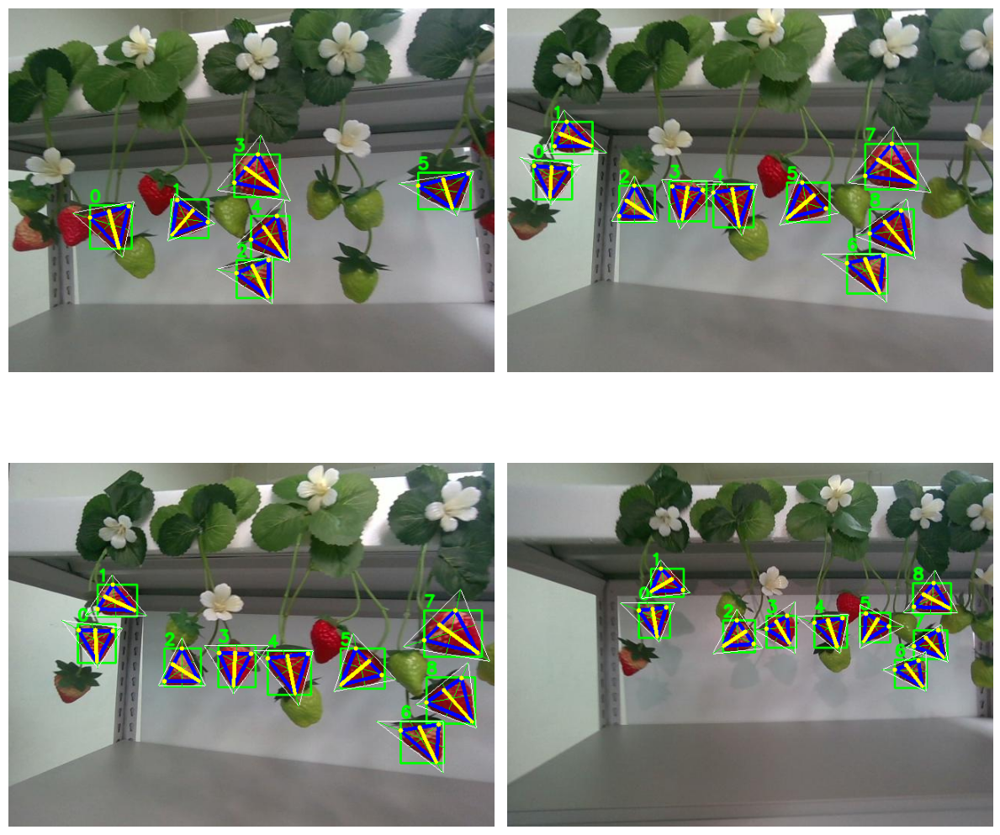

In [53]:
import os, glob, cv2, numpy as np, matplotlib.pyplot as plt
from collections import defaultdict

# ── 경로 ────────────────────────────────────────────────
inst_folder = './runs/segment_exp_test/instance_masks'
rgb_folder  = './data/images/test'
out_folder  = './runs/segment_exp_test/numbering_and_triangles'
os.makedirs(out_folder, exist_ok=True)

# ── 파라미터 ────────────────────────────────────────────
RIPE_RATIO_THRESH = 0.70
MIN_OVERLAP_RATIO = 0.05
IOU_THRESH        = 0.02
KERNEL            = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
RADIUS            = 3           # dilate 반경 → BBox 확장(px)
# 시각화용
LINE_THICKNESS, INNER_THICKNESS, GRIPPER_THICKNESS, CIRCLE_RADIUS = 2,3,3,3

# ── 유틸 ────────────────────────────────────────────────
def is_ripe_mask(hsv, mask_bool):
    h,s = hsv[:,:,0], hsv[:,:,1]
    red = ((h<10)|(h>160)) & (s>50) & mask_bool
    return mask_bool.sum()>0 and red.sum()/mask_bool.sum() >= RIPE_RATIO_THRESH

def sample_line(p1,p2):
    x1,y1=p1; x2,y2=p2
    L=int(np.hypot(x2-x1,y2-y1))+1
    xs=np.linspace(x1,x2,L).astype(int); ys=np.linspace(y1,y2,L).astype(int)
    return zip(xs,ys)

def fit_outer_inner(mask_bool):
    cnts,_=cv2.findContours((mask_bool*255).astype(np.uint8),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
    if not cnts: return None,None
    _,tri=cv2.minEnclosingTriangle(max(cnts,key=cv2.contourArea))
    outer=tri.reshape(3,2).astype(int)
    h,w = mask_bool.shape
    inner=[]
    for i in range(3):
        vtx=tuple(outer[i]); opp=outer[np.arange(3)!=i]; mid=tuple(opp.mean(0).astype(int))
        for x,y in sample_line(vtx,mid):
            if 0<=x<w and 0<=y<h and mask_bool[y,x]:
                inner.append((x,y)); break
        else: inner.append(vtx)
    return outer, np.array(inner,int)

# ── 1) 파일 그룹화 ─────────────────────────────────────
groups=defaultdict(list)
for p in sorted(glob.glob(os.path.join(inst_folder,'*.png'))):
    groups[os.path.basename(p).rsplit('_',1)[0]].append(p)

# ── 2) 프레임별 처리 ───────────────────────────────────
for key,mask_paths in groups.items():
    # a) RGB load
    rgb=None
    for ext in ('.png','.jpg'):
        fp=os.path.join(rgb_folder,key+ext)
        if os.path.exists(fp): rgb=cv2.imread(fp); break
    if rgb is None: continue
    hsv=cv2.cvtColor(rgb,cv2.COLOR_BGR2HSV); vis=rgb.copy()
    H,W = rgb.shape[:2]

    # b) 마스크·BBox·숙성 판정
    masks,boxes,areas,ripe_idx=[],[],[],[]
    for p in mask_paths:
        raw=cv2.imread(p,cv2.IMREAD_UNCHANGED)
        if raw is None: continue
        mb=np.any(raw>0,2) if raw.ndim>2 else raw>0
        masks.append(mb:=mb.astype(bool))
        x,y,bw,bh=cv2.boundingRect(mb.astype(np.uint8))
        boxes.append((x,y,bw,bh)); areas.append(mb.sum())
        if is_ripe_mask(hsv,mb): ripe_idx.append(len(masks)-1)
    n=len(masks)
    if not ripe_idx: continue

    # c) Truncation
    trunc={k for k,(x,y,bw,bh) in enumerate(boxes)
           if x<=1 or y<=1 or x+bw>=W-1 or y+bh>=H-1}

    # d) Occlusion (BBox → 픽셀)
    occl=set()
    for i in ripe_idx:
        xi,yi,wi,hi=boxes[i]
        xi1,yi1=xi-RADIUS,yi-RADIUS; xi2,yi2=xi+wi+RADIUS,yi+hi+RADIUS
        for j in range(n):
            if i==j or j in occl: continue
            xj,yj,wj,hj=boxes[j]
            # 1) BBox filter
            if xj>xi2 or xj+wj<xi1 or yj>yi2 or yj+hj<yi1: continue
            mi,mj=masks[i],masks[j]
            # 2) strict overlap
            inter=np.logical_and(mi,mj).sum()
            if inter/areas[i] >= MIN_OVERLAP_RATIO or inter/areas[j] >= MIN_OVERLAP_RATIO:
                occl.add(i if areas[i]<areas[j] else j); continue
            # 3) dilate overlap
            mi_d=cv2.dilate(mi.astype(np.uint8),KERNEL); mj_d=cv2.dilate(mj.astype(np.uint8),KERNEL)
            inter2=np.logical_and(mi_d,mj_d).sum()
            if inter2/areas[i] >= MIN_OVERLAP_RATIO or inter2/areas[j] >= MIN_OVERLAP_RATIO:
                occl.add(i if areas[i]<areas[j] else j); continue
            # 4) IoU fallback
            xi1b,yi1b=max(xi,xj),max(yi,yj); xi2b,yi2b=min(xi+wi,xj+wj),min(yi+hi,yj+hj)
            if xi2b>xi1b and yi2b>yi1b:
                inter_a=(xi2b-xi1b)*(yi2b-yi1b); union=areas[i]+areas[j]-inter_a
                if inter_a/union > IOU_THRESH:
                    occl.add(i if areas[i]<areas[j] else j)

    # e) visible 숙성
    visible=[k for k in ripe_idx if k not in occl and k not in trunc]
    if not visible: continue

    # f) 번호 부여 (좌→우)
    centers=[(k,np.where(masks[k])[1].mean()) for k in visible]
    centers.sort(key=lambda x:x[1]); new_id={k:i for i,(k,_) in enumerate(centers)}

    # g) 시각화 + 삼각형·파지축
    for k in visible:
        mb=masks[k]; x,y,bw,bh=boxes[k]
        cv2.rectangle(vis,(x,y),(x+bw,y+bh),(0,255,0),LINE_THICKNESS)
        cv2.putText(vis,str(new_id[k]),(x,y-5),cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),LINE_THICKNESS,cv2.LINE_AA)

        outer,inner=fit_outer_inner(mb)
        if outer is None: continue
        cv2.polylines(vis,[outer],True,(255,255,255),1)
        for i in range(3):
            vtx=tuple(outer[i]); mid=tuple(((outer[(i+1)%3]+outer[(i+2)%3])//2).astype(int))
            cv2.line(vis,vtx,mid,(0,255,0),1)
        cv2.polylines(vis,[inner],True,(255,0,0),INNER_THICKNESS)

        idx=np.argsort(inner[:,1]); g1,g2=inner[idx[0]],inner[idx[1]]
        other=tuple(inner[idx[2]]); mid=((g1+g2)//2).astype(int)
        for p in (g1,g2,mid): cv2.circle(vis,tuple(p),CIRCLE_RADIUS,(0,255,255),-1)
        cv2.line(vis,tuple(mid),other,(0,255,255),GRIPPER_THICKNESS)

    cv2.imwrite(os.path.join(out_folder,f'{key}_final.png'),vis)

# ── 미리보기 ────────────────────────────────────────────
pre=sorted(glob.glob(os.path.join(out_folder,'*_final.png')))[:4]
if pre:
    fig,axarr=plt.subplots(2,2,figsize=(12,12))
    for ax,p in zip(axarr.flat,pre):
        ax.imshow(cv2.imread(p)[...,::-1]); ax.axis('off')
    plt.tight_layout(); plt.show()


In [59]:
import os, glob, re, cv2, json, math, numpy as np
from collections import defaultdict

# ── 경로 ────────────────────────────────────────────────
split = 'test'
base_data = './data'
rgb_folder   = os.path.join(base_data, 'images', split)
depth_folder = os.path.join(base_data, 'depth_maps', split)
inst_folder  = './runs/segment_exp_test/instance_masks'

out_folder  = os.path.join('./runs/segment_exp_test/numbering_and_triangles', split)
json_folder = os.path.join(out_folder, 'json')
os.makedirs(out_folder, exist_ok=True); os.makedirs(json_folder, exist_ok=True)

# ── 하이퍼파라미터 ─────────────────────────────────────
RIPE_RATIO_THRESH = 0.70
MIN_OVERLAP_RATIO = 0.05
IOU_THRESH        = 0.02
KERNEL            = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
RADIUS            = 3                        # dilate 반경 → BBox 확장(px)
# 시각화
LINE_THICKNESS, INNER_THICKNESS, GRIPPER_THICKNESS, CIRCLE_RADIUS = 2,3,3,3

# ── 유틸 ───────────────────────────────────────────────
def is_ripe_mask(hsv, mask_bool):
    h,s = hsv[:,:,0], hsv[:,:,1]
    red = ((h<10)|(h>160)) & (s>50) & mask_bool
    return mask_bool.sum()>0 and red.sum()/mask_bool.sum() >= RIPE_RATIO_THRESH

def sample_line(p1,p2):
    x1,y1=p1; x2,y2=p2; L=int(np.hypot(x2-x1,y2-y1))+1
    xs=np.linspace(x1,x2,L).astype(int); ys=np.linspace(y1,y2,L).astype(int)
    return zip(xs,ys)

def fit_outer_inner(mask_bool):
    cnts,_ = cv2.findContours((mask_bool*255).astype(np.uint8),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
    if not cnts: return None,None
    _,tri = cv2.minEnclosingTriangle(max(cnts,key=cv2.contourArea))
    outer = tri.reshape(3,2).astype(int)
    h,w = mask_bool.shape; inner=[]
    for i in range(3):
        vtx=tuple(outer[i]); opp=outer[np.arange(3)!=i]; mid=tuple(opp.mean(0).astype(int))
        for x,y in sample_line(vtx,mid):
            if 0<=x<w and 0<=y<h and mask_bool[y,x]: inner.append((x,y)); break
        else: inner.append(vtx)
    return outer, np.array(inner,int)

# ── 1) test 키 목록 추출 ───────────────────────────────
img_keys=[os.path.splitext(f)[0] for f in sorted(os.listdir(rgb_folder))
          if f.lower().endswith(('.png','.jpg','.jpeg'))]

# ── 2) 프레임별 처리 ───────────────────────────────────
for key in img_keys:
    # a) RGB 로드
    rgb_path = next((os.path.join(rgb_folder,key+ext) for ext in ('.png','.jpg','.jpeg')
                     if os.path.exists(os.path.join(rgb_folder,key+ext))), None)
    if rgb_path is None: print(f"[{key}] RGB 없음"); continue
    rgb=cv2.imread(rgb_path); hsv=cv2.cvtColor(rgb,cv2.COLOR_BGR2HSV)
    vis=rgb.copy(); H,W=rgb.shape[:2]

    # b) 해당 마스크 파일
    mask_paths = sorted(glob.glob(os.path.join(inst_folder,f'{key}_*.png')))
    if not mask_paths: print(f"[{key}] 마스크 없음"); continue

    # c) (옵션) depth
    depth_path = os.path.join(depth_folder,f'Depth_{re.sub(r"[^0-9]", "", key)}.npy')
    depth_map = np.load(depth_path) if os.path.exists(depth_path) else None

    # d) 숙성 필터 + BBox 계산
    masks, boxes, areas = [],[],[]
    for mp in mask_paths:
        raw=cv2.imread(mp,cv2.IMREAD_UNCHANGED);  # RGBA or Gray
        if raw is None: continue
        mb = (np.any(raw>0,2) if raw.ndim>2 else raw>0).astype(bool)
        if not is_ripe_mask(hsv,mb): continue
        masks.append(mb)
        x,y,bw,bh = cv2.boundingRect(mb.astype(np.uint8))
        boxes.append((x,y,bw,bh)); areas.append(mb.sum())
    n=len(masks)
    if n==0: print(f"[{key}] 숙성 없음"); continue

    # e) Truncation
    trunc={k for k,(x,y,bw,bh) in enumerate(boxes)
           if x<=1 or y<=1 or x+bw>=W-1 or y+bh>=H-1}

    # f) Occlusion (BBox 필터 → 픽셀)
    occl=set()
    for i in range(n):
        xi,yi,wi,hi = boxes[i]; xi1,yi1=xi-RADIUS,yi-RADIUS; xi2,yi2=xi+wi+RADIUS,yi+hi+RADIUS
        for j in range(i+1,n):
            xj,yj,wj,hj = boxes[j]
            if xj>xi2 or xj+wj<xi1 or yj>yi2 or yj+hj<yi1: continue  # 교차X
            mi,mj=masks[i],masks[j]

            # strict
            inter=np.logical_and(mi,mj).sum()
            if (inter>=MIN_OVERLAP_RATIO*min(areas[i],areas[j])):
                occl.add(j if areas[i]>areas[j] else i); continue

            # dilate
            mi_d=cv2.dilate(mi.astype(np.uint8),KERNEL); mj_d=cv2.dilate(mj.astype(np.uint8),KERNEL)
            inter2=np.logical_and(mi_d,mj_d).sum()
            if (inter2>=MIN_OVERLAP_RATIO*min(areas[i],areas[j])):
                occl.add(j if areas[i]>areas[j] else i); continue

            # IoU fallback
            xi1b,yi1b=max(xi,xj),max(yi,yj); xi2b,yi2b=min(xi+wi,xj+wj),min(yi+hi,yj+hj)
            if xi2b>xi1b and yi2b>yi1b:
                inter_a=(xi2b-xi1b)*(yi2b-yi1b); union=areas[i]+areas[j]-inter_a
                if inter_a/union > IOU_THRESH:
                    occl.add(j if areas[i]>areas[j] else i)

    visible=[k for k in range(n) if k not in occl and k not in trunc]
    if not visible: print(f"[{key}] visible 없음"); continue

    # g) 좌→우 정렬 & ID
    centers=[(k,np.where(masks[k])[1].mean()) for k in visible]
    centers.sort(key=lambda x:x[1]); id_map={k:i for i,(k,_) in enumerate(centers)}

    # h) 시각화 + JSON
    json_out=[]
    for k,_ in centers:
        mb=masks[k]; x,y,bw,bh=boxes[k]
        cv2.rectangle(vis,(x,y),(x+bw,y+bh),(0,255,0),LINE_THICKNESS)
        cv2.putText(vis,str(id_map[k]),(x,y-5),cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),LINE_THICKNESS)

        outer,inner=fit_outer_inner(mb);  # 삼각형
        if outer is None: continue
        idx=np.argsort(inner[:,1]); g1,g2,other=inner[idx[0]],inner[idx[1]],tuple(inner[idx[2]])
        mid=((g1+g2)//2).astype(int)
        for p in (g1,g2,mid): cv2.circle(vis,tuple(p),CIRCLE_RADIUS,(0,255,255),-1)
        cv2.line(vis,tuple(mid),other,(0,255,255),GRIPPER_THICKNESS)

        # depth
        d_g1 = float(depth_map[g1[1],g1[0]]) if depth_map is not None else None
        d_g2 = float(depth_map[g2[1],g2[0]]) if depth_map is not None else None
        d_mid= float(depth_map[mid[1],mid[0]]) if depth_map is not None else None
        axis_angle=float(math.degrees(math.atan2(other[1]-mid[1],other[0]-mid[0])))

        json_out.append({
            "id": id_map[k],
            "grasp_pts": {"p1":g1.tolist(),"p2":g2.tolist()},
            "depth_pts": {"d1":d_g1,"d2":d_g2},
            "center_pt": mid.tolist(),
            "depth_center": d_mid,
            "axis_angle": axis_angle
        })

    cv2.imwrite(os.path.join(out_folder,f'{key}_final.png'),vis)
    with open(os.path.join(json_folder,f'{key}.json'),'w',encoding='utf8') as f:
        json.dump(json_out,f,ensure_ascii=False,indent=4)

print("\n전체 처리 완료!")



전체 처리 완료!
